In [16]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np
import umap
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.mixture import GaussianMixture
from sklearn.feature_selection import SelectKBest, f_classif

In [17]:
pd.set_option("display.max_rows", 250000)

In [303]:
df = pd.read_csv('/Users/robholmstrom/OneDrive/Gitrepos/nonrepo_files/GSE59114.csv', header = 1)
df1 = df.T
df1.columns = df1.loc['Gene Symbol'].reset_index()
df1 = df1.drop(['Gene Symbol', 'UCSC transcripts'])
df1.columns = [x[1] for x in df1.columns]
df1.columns = df1.columns.str.replace("'", "")
df1.shape

(1434, 8422)

In [975]:
df1.head(20)

,Npl,Qk,Park2,Agpat4,Slc22a3,uc008akv.1,Airn,Mrpl18,Tcp1,Rnasel,...,Ezr,Rsph3b,Tagap1,Rnaset2b,Dhx9,Rsph3a,Rnaset2a,Fgfr1op,Mpc1,Sft2d1
young_LT_HSC_2,0,0,2.66676,0,0,0,0,9.25531,0,0,...,7.89221,0,2.52356,0,0,0,0,1.47508,0,0
young_LT_HSC_6,0,0,0,0,0,0,0,0,10.5123,3.63343,...,0,8.29825,0,0,0,0,7.6595,0,8.22323,0
young_LT_HSC_8,0,0,6.33181,0,0,0,3.93546,0,0,7.18398,...,8.6596,7.70736,7.17562,0,0,0,0,0,6.13422,8.08714
young_LT_HSC_9,0,0,0,0,0,0,0,8.79727,0,0,...,2.31325,3,7.84587,7.8404,8.90812,0,0,8.49538,0,6.74349
young_LT_HSC_10,0,0,0,2.15704,6.61412,0,0,8.83564,6.11541,8.17223,...,0,8.12138,8.26651,0,5.87234,6.19318,0,9.28304,6.66221,8.18908
young_LT_HSC_11,0,0,4.9644,0,0,0,0,9.47921,1.38405,0,...,3.49697,2.488,7.5697,0,0,0,0,1.70929,7.87504,7.99481
young_LT_HSC_12,0,6.09001,0,7.24888,0,0,2.48543,8.49137,0,1.58976,...,0,7.8233,8.85106,0,0,7.4297,0,0,0,9.71512
young_LT_HSC_14,0,0,8.01564,4.36457,0,0,0,9.08239,9.4613,8.55597,...,0,3.70044,0,8.31116,2.44095,0,0,0,8.65456,0
young_LT_HSC_15,0,0,7.25644,8.62545,0,0,2.02503,0,7.43904,8.93041,...,1.03562,8.13965,0,0,6.89736,6.73498,0,0,0,0
young_LT_HSC_16,0,0,0,0,3.72683,0,2.06695,7.80226,9.43946,8.739,...,0,2.51854,0,0,6.91648,0,0,5.53699,8.38965,9.30834


Itgam, Ly6g, Ptprc, Cd3e, Ly76, Kit, Ly6a, Cd48, Slamf1

In [309]:
import re
df1_1 = df1[~df1.index.str.contains('biol_replicate')]
df1_1 = df1_1.drop(['\'Young LT-HSC\'','\'Young ST-HSC\'', '\'Young MPP\'','\'Old LT-HSC\'', '\'Old ST-HSC\'','Old MPP\''])
df1_1 = df1_1.drop(['Itgam', 'Ptprc', 'Kit', 'Ly6a', 'Cd48', 'Slamf1'], axis = 1)

In [310]:
df2

,Npl,Qk,Park2,Agpat4,Slc22a3,uc008akv.1,Airn,Mrpl18,Tcp1,Rnasel,...,Ezr,Rsph3b,Tagap1,Rnaset2b,Dhx9,Rsph3a,Rnaset2a,Fgfr1op,Mpc1,Sft2d1
youngLTHSC,0.00,0.00,2.67,0.00,0.00,0.00,0.00,9.26,0.00,0.00,...,7.89,0.00,2.52,0.00,0.00,0.00,0.00,1.48,0.00,0.00
youngLTHSC,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.51,3.63,...,0.00,8.30,0.00,0.00,0.00,0.00,7.66,0.00,8.22,0.00
youngLTHSC,0.00,0.00,6.33,0.00,0.00,0.00,3.94,0.00,0.00,7.18,...,8.66,7.71,7.18,0.00,0.00,0.00,0.00,0.00,6.13,8.09
youngLTHSC,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.80,0.00,0.00,...,2.31,3.00,7.85,7.84,8.91,0.00,0.00,8.50,0.00,6.74
youngLTHSC,0.00,0.00,0.00,2.16,6.61,0.00,0.00,8.84,6.12,8.17,...,0.00,8.12,8.27,0.00,5.87,6.19,0.00,9.28,6.66,8.19
youngLTHSC,0.00,0.00,4.96,0.00,0.00,0.00,0.00,9.48,1.38,0.00,...,3.50,2.49,7.57,0.00,0.00,0.00,0.00,1.71,7.88,7.99
youngLTHSC,0.00,6.09,0.00,7.25,0.00,0.00,2.49,8.49,0.00,1.59,...,0.00,7.82,8.85,0.00,0.00,7.43,0.00,0.00,0.00,9.72
youngLTHSC,0.00,0.00,8.02,4.36,0.00,0.00,0.00,9.08,9.46,8.56,...,0.00,3.70,0.00,8.31,2.44,0.00,0.00,0.00,8.65,0.00
youngLTHSC,0.00,0.00,7.26,8.63,0.00,0.00,2.03,0.00,7.44,8.93,...,1.04,8.14,0.00,0.00,6.90,6.73,0.00,0.00,0.00,0.00
youngLTHSC,0.00,0.00,0.00,0.00,3.73,0.00,2.07,7.80,9.44,8.74,...,0.00,2.52,0.00,0.00,6.92,0.00,0.00,5.54,8.39,9.31


In [311]:
df1_1.index = df1_1.index.str.replace(r'[^a-zA-Z]', '')

print((df1_1.columns).shape)
print(np.unique(df1_1.index))

(8416,)
['oldLTHSC' 'oldMPP' 'oldSTHSC' 'youngLTHSC' 'youngMPP' 'youngSTHSC']


In [312]:
df1_1dup = df1_1[df1_1.loc[:,df1_1.columns.duplicated()].columns]

In [313]:
dupcols = np.unique(df1_1dup.columns)
dupcols

array(['Abcg2', 'Arih1', 'Atf7ip', 'Atrip', 'Brwd1', 'Cbx1', 'Ccnd3',
       'Cdk6', 'Celf1', 'Commd1', 'Csnk1a1', 'Ctse', 'Dnajb6', 'Eci2',
       'Eif1ax', 'Fgd4', 'Fus', 'G3bp1', 'Glod4', 'Gm10598', 'Gm13215',
       'Hjurp', 'Ikbkb', 'Ing4', 'Itga4', 'Itga6', 'Kansl2', 'Lcor',
       'Lrrc29', 'Luc7l2', 'Mafg', 'Mecom', 'Mob1a', 'Mtcp1', 'Nagk',
       'Ndufa3', 'Pafah1b1', 'Patz1', 'Pcif1', 'Pik3ip1', 'Psme4', 'Pten',
       'Ramp2', 'Rpl24', 'Rspry1', 'Satb1', 'Smarcc2', 'Srcap', 'Srsf10',
       'Sugp2', 'Taf9', 'Tex261', 'Tmem167b', 'Tmem181b-ps', 'Trappc9',
       'Trim30b', 'U2af1l4', 'Utp23', 'Wwp2', 'Zbtb20', 'Zfp708',
       'Zfp869', 'Zgpat'], dtype=object)

In [314]:
df1_1dupgroup = df1_1dup.groupby(df1_1dup.columns, axis=1).sum()

In [315]:
df1_1dupmean = pd.DataFrame()
for x in dupcols:
    df1_1dupmean[x] = df1_1dupgroup[x]/df1_1dup.columns.tolist().count(x)


In [316]:
dfnodup = df1_1.loc[:,~df1_1.columns.duplicated()].drop(dupcols, axis = 1)

df2 = pd.concat([dfnodup, df1_1dupmean], axis = 1)

df2= df2.astype(np.float64).round(2)
df2

,Npl,Qk,Park2,Agpat4,Slc22a3,uc008akv.1,Airn,Mrpl18,Tcp1,Rnasel,...,Tmem181b-ps,Trappc9,Trim30b,U2af1l4,Utp23,Wwp2,Zbtb20,Zfp708,Zfp869,Zgpat
youngLTHSC,0.00,0.00,2.67,0.00,0.00,0.00,0.00,9.26,0.00,0.00,...,4.00,4.49,3.27,0.00,2.08,0.00,4.22,1.60,4.30,0.00
youngLTHSC,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.51,3.63,...,4.60,1.60,0.00,0.00,1.75,1.03,3.12,0.00,7.91,0.00
youngLTHSC,0.00,0.00,6.33,0.00,0.00,0.00,3.94,0.00,0.00,7.18,...,4.83,3.56,0.72,0.00,0.95,0.00,4.10,0.00,0.00,0.00
youngLTHSC,0.00,0.00,0.00,0.00,0.00,0.00,0.00,8.80,0.00,0.00,...,4.02,2.00,0.66,5.35,1.81,3.90,0.96,0.00,0.00,0.00
youngLTHSC,0.00,0.00,0.00,2.16,6.61,0.00,0.00,8.84,6.12,8.17,...,3.71,4.07,0.00,7.58,2.19,0.00,0.00,4.20,0.00,0.00
youngLTHSC,0.00,0.00,4.96,0.00,0.00,0.00,0.00,9.48,1.38,0.00,...,4.80,4.70,0.40,0.00,3.97,4.06,3.51,0.00,0.00,7.62
youngLTHSC,0.00,6.09,0.00,7.25,0.00,0.00,2.49,8.49,0.00,1.59,...,2.75,0.99,7.01,0.00,1.36,7.30,5.07,0.00,0.00,0.00
youngLTHSC,0.00,0.00,8.02,4.36,0.00,0.00,0.00,9.08,9.46,8.56,...,4.03,4.78,3.60,7.81,2.47,3.44,2.77,0.00,0.00,0.00
youngLTHSC,0.00,0.00,7.26,8.63,0.00,0.00,2.03,0.00,7.44,8.93,...,3.87,2.39,0.00,6.74,1.97,0.85,6.96,0.00,0.00,0.00
youngLTHSC,0.00,0.00,0.00,0.00,3.73,0.00,2.07,7.80,9.44,8.74,...,7.73,5.98,0.00,7.48,1.65,6.77,4.49,3.34,0.00,3.99


In [598]:
dfdes = df2.describe().T
dfdes = df2.replace(0, np.nan).describe().T

In [727]:
varcols = dfdes[dfdes['std']/dfdes['mean']<.12].index
varcols
dfvar= df2[varcols]
dfvar.shape

(1058, 135)

In [728]:
genefracs = (dfvar==0).sum()/(dfvar==0).count()
genefracs = (dfvar.replace(np.nan, 0)==0).sum()/(dfvar.replace(np.nan, 0)==0).count()
passindex = genefracs[genefracs < .95]
df2sel = dfvar[passindex.index]

In [729]:
df2sel.shape

(1058, 129)

In [730]:
pcasel = PCA(n_components = 2)
pcafitdf2sel = pcasel.fit_transform(df2sel)

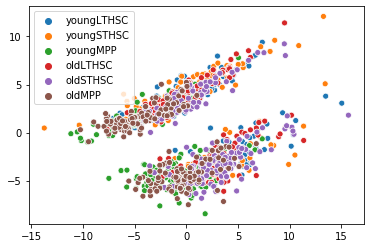

In [731]:
sns.scatterplot(pcafitdf2sel[:,0], pcafitdf2sel[:,1], hue = df2.index)

In [768]:
umap_resultssel = umap.UMAP(n_neighbors=50,
                      min_dist=.2,
                      metric='euclidean').fit_transform(df2sel)

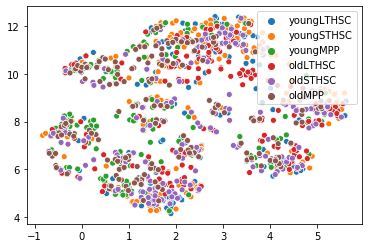

In [769]:
sns.scatterplot(umap_resultssel[:,0], umap_resultssel[:,1], hue = df2.index)

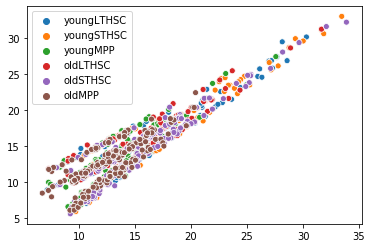

In [775]:
km = KMeans(n_clusters = 8, random_state=42)
kmdata = km.fit_transform(df2sel)
sns.scatterplot(kmdata[:,0], kmdata[:, 1], hue = df2.index)

In [778]:
gmm = GaussianMixture(n_components = 2)
gmm.fit(df2sel)
cluster = gmm.fit_predict(df2sel)

(<matplotlib.axes._subplots.AxesSubplot at 0x7fd540bad810>,)

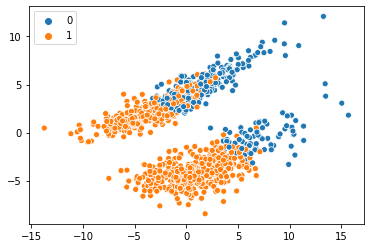

In [779]:
sns.scatterplot(pcafitdf2sel[:,0], pcafitdf2sel[:,1], hue = cluster), #palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})

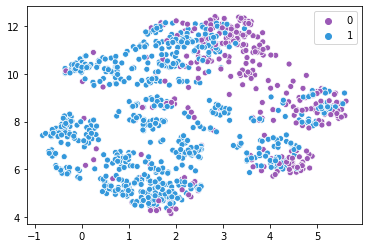

In [780]:
sns.scatterplot(umap_resultssel[:,0], umap_resultssel[:,1], hue = cluster, palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})

'Sell', 'Pdcd4', 'Cd34', 'Gnb1', 'Plac8', 'Flt3', 'Cbx3', 'Mmrn1',
       'BC035044', 'Nkg7', 'Nupr1', 'Sult1a1', 'Arglu1', 'Gpr97', 'uc012hdk.1',
       'Tespa1', 'Mpo', 'Eif1', 'Zfp187', 'Sod1'

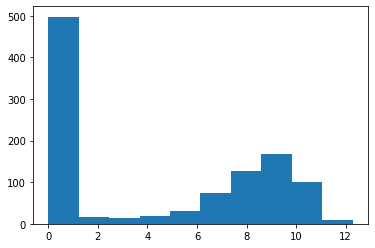

In [572]:
plt.hist(df2['Flt3'])
plt.show()

In [573]:
(df2['Cd34']==0).value_counts()

False    823
True     235
Name: Cd34, dtype: int64

In [574]:
pca = PCA(n_components = 10)
pcafitdf2 = pca.fit_transform(df2)


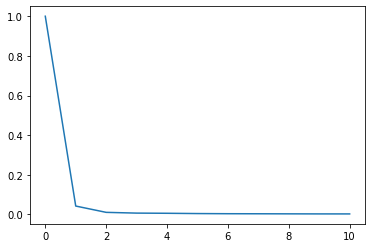

In [575]:
variance = np.insert(pca.explained_variance_ratio_, 0, 1)
x = [i for i in range(variance.shape[0])]

plt.plot(x, variance)



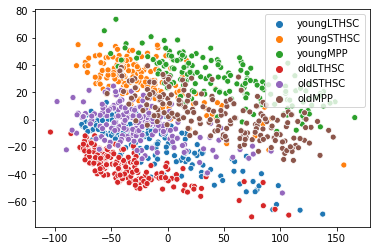

In [576]:
import seaborn as sns
sns.scatterplot(pcafitdf2[:,0], pcafitdf2[:,1], hue = df2.index)

In [577]:
umap_results = umap.UMAP(n_neighbors=20,
                      min_dist=.1,
                      metric='euclidean').fit_transform(df2)

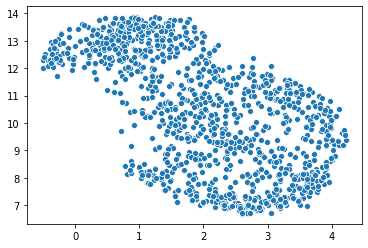

In [70]:
sns.scatterplot(umap_results[:,0], umap_results[:,1])

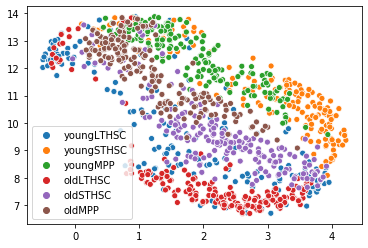

In [71]:
sns.scatterplot(umap_results[:,0], umap_results[:,1], hue = df2.index)

In [72]:
import random
cell_types = np.unique(df2.index).tolist()
c = []
for i in range(len(cell_types)):
    r = random.random()
    g = random.random()
    b = random.random()
    color = (r,g,b)
    c.append(color)

In [73]:
print(umap_results[:][0].max())
print(umap_results[:][0].min())
print(umap_results[:][1].max())
print(umap_results[:][1].min())


9.091201
2.4932199
7.512029
3.1040192


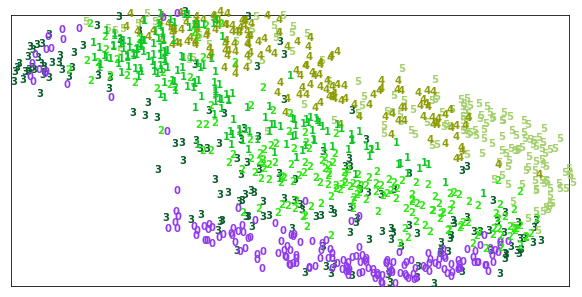

In [74]:
plt.figure(figsize = (10,5))
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i][0], umap_results[i][1], str(cell_types.index(df2.index[i])),
    color = c[int(cell_types.index(df2.index[i]))],
    fontdict={'weight': 'bold', 'size': 10})
    


plt.xlim(min(umap_results, key = lambda x:x[0])[0], max(umap_results, key = lambda x:x[0])[0])
plt.ylim(min(umap_results, key = lambda x:x[1])[1], max(umap_results, key = lambda x:x[1])[1])
plt.xticks([])
plt.yticks([])

plt.show()

In [83]:
dbscan_clusters6 = DBSCAN(eps=.205, min_samples=5, metric = 'euclidean')

# Fit model
dbscan_clusters6.fit(umap_results)
dbpred = dbscan_clusters6.labels_
np.unique(dbpred)

array([-1,  0,  1,  2,  3,  4])

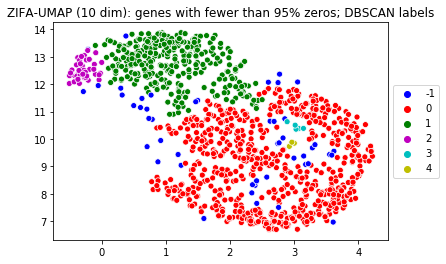

In [87]:
fig = sns.scatterplot(umap_results[:,0], umap_results[:,1], hue = dbpred,palette =['b', 'r', 'g', 'm', 'c', 'y'])#, 'k', 'grey', 'w'])
fig.set_title('ZIFA-UMAP (10 dim): genes with fewer than 95% zeros; DBSCAN labels')
fig.legend(loc='center left', bbox_to_anchor=(1, 0.5))

In [786]:
gmm = GaussianMixture(n_components = 6)
gmm.fit(df2)
cluster = gmm.fit_predict(df2)
cluster.shape

array([5, 5, 3, ..., 3, 3, 2])

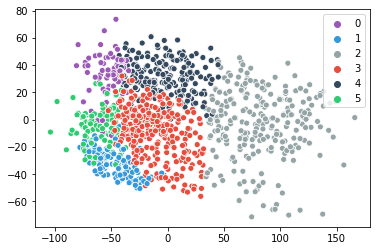

In [818]:
pca = PCA(n_components = 2, random_state = 42)
pcafit = pca.fit_transform(df2)
sns.scatterplot(pcafit[:,0], pcafit[:,1], hue = cluster, palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})

In [792]:
np.unique(cluster)
cluster.shape, df2.shape

((1058,), (1058, 8351))

In [961]:
df2gmm = df2.copy()
df2gmm.index = cluster
y = [x for x in df2gmm.index]

k =100
kbestgmm = SelectKBest(k=k, score_func=f_classif)
X_best_featgmm = kbestgmm.fit_transform(df2gmm,y)

X_best_featgmm = pd.DataFrame(X_best_featgmm, columns=df2gmm.columns[kbestgmm.get_support()])

gmmbest = X_best_featgmm.columns
gmmbest


Index(['Chtf18', 'H2-K1', 'Tubb5', 'Nrm', 'Sell', 'Uhrf1', 'Ndc80', 'Nuf2',
       'Malat1', 'Cdca5', 'Prim2', 'Fen1', 'Kif11', 'Hells', 'Mcm10', 'Lrrc8a',
       'Spc25', 'Cdca7', 'Nsl1', 'Dtl', 'Cd34', 'Bub1b', 'Casc5', 'Rad51',
       'Nusap1', 'Dut', 'Ncaph', 'Ckap2l', 'Pcna', 'Cks1b', 'Rad54b', 'Smc2',
       'Cdca8', 'Clspn', 'Rpa2', 'Apitd1', 'Gnb1', 'SNORD93', 'Tyms', 'Tacc3',
       'Ncapg', 'Cdk1', 'Plac8', 'Rfc5', 'Mcm7', 'Flt3', 'Cbx3', 'Mmrn1',
       'Mcm2', 'Cdca3', 'Rad51ap1', 'BC035044', 'Clec1a', 'Lig1', 'Nkg7',
       'Prc1', 'Rrm1', 'Nupr1', 'Sult1a1', 'Kif22', 'Dctpp1', 'uc012fxx.1',
       'Arglu1', 'Mcm5', 'Asf1b', 'Gpr97', 'Gins2', 'uc009nvv.1', 'Dnmt1',
       'Tipin', 'uc009qeb.1', 'Prim1', 'Ptges3', 'Timeless', 'Pola1',
       'uc007hxv.1', 'Ppia', 'Fignl1', 'Aurkb', 'Fam64a', 'Mpo', 'Cdc6',
       'Top2a', 'Ptrf', 'Tk1', 'Birc5', 'Rrm2', 'Ptma', 'Ncapg2', 'Zfp187',
       'Gmnn', 'Serpinb1a', 'Cenph', 'Pbk', 'Mcm3', 'Atad2', 'Cenpm', 'Rfc4',
       'uc007yyn

In [962]:
df2gmmbest = df2gmm[gmmbest]



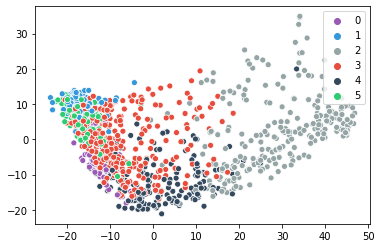

In [963]:
pcagmm = PCA(n_components = 2, random_state = 42)
pcagmmfit = pcagmm.fit_transform(df2gmmbest)
sns.scatterplot(pcagmmfit[:,0], pcagmmfit[:,1], hue = cluster, palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})

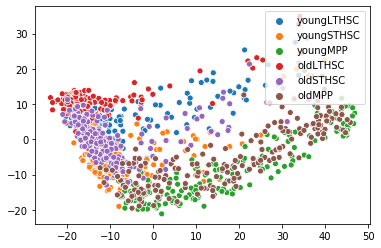

In [964]:

sns.scatterplot(pcagmmfit[:,0], pcagmmfit[:,1], hue = df2.index)

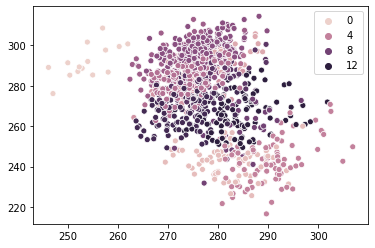

In [966]:
km = KMeans(n_clusters = 12, random_state=42)
kmdata = km.fit_transform(df2)
kpred = km.fit_predict(df2)
sns.scatterplot(kmdata[:,0], kmdata[:, 1], hue = kpred)#, palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})

In [971]:
df2km = df2.copy()
df2km.index = kpred
y = [x for x in df2km.index]

k =100
kbestkm = SelectKBest(k=k, score_func=f_classif)
X_best_featkm = kbestkm.fit_transform(df2gmm,y)

X_best_featkm = pd.DataFrame(X_best_featkm, columns=df2km.columns[kbestkm.get_support()])

kmbest = X_best_featkm.columns
kmbest


Index(['H2-K1', 'Tubb5', 'Sell', 'Sgol1', 'Uhrf1', 'Ndc80', 'Nuf2', 'Kif20a',
       'Malat1', 'Cdca5', 'Prim2', 'Fen1', 'Kif11', 'Hells', 'Arhgap19',
       'Spc25', 'Cdca7', 'Dtl', 'Cd34', 'Fbxo5', 'Bub1b', 'Casc5', 'Nusap1',
       'Dut', 'Ncaph', 'Bub1', 'Ckap2l', 'Tpx2', 'Ube2c', 'Aurka', 'Ect2',
       'Cks1b', 'Kif2c', 'Cdca8', 'Clspn', 'Apitd1', 'Gnb1', 'Tacc3', 'Ncapg',
       'Cdk1', 'Plac8', 'Mcm7', 'Flt3', 'Cbx3', 'Mmrn1', 'Mcm2', 'Cdca3',
       'BC035044', 'Lig1', 'Nkg7', 'Prc1', 'Rrm1', 'Kif22', 'Mki67',
       'uc012fxx.1', 'Shcbp1', 'Arglu1', 'Mcm5', 'Asf1b', 'Gpr97', 'Cenpn',
       'Gins2', 'uc009nvv.1', 'Tipin', 'uc009qeb.1', 'Ccnb2', 'Ttk', 'Kif15',
       'Prim1', 'Kif4', 'Cenpi', 'Ppia', 'Fignl1', 'Aurkb', 'Fam64a', 'Spag5',
       'Mpo', 'Cdc6', 'Top2a', 'Ptrf', 'Tk1', 'Birc5', 'Rrm2', 'Mis18bp1',
       'Ptma', 'Ighv1-30', 'Zfp187', 'Hist1h1b', 'Gmnn', 'H2afy', 'Ccnb1',
       'Dlgap5', 'Pbk', 'Esco2', 'Mcm3', 'Cenpm', 'Rfc4', 'uc007yyn.2', 'Sod1',
       'Cdk6

In [972]:
df2kmbest = df2km[kmbest]



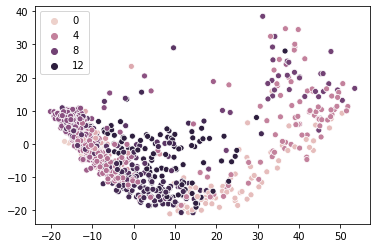

In [973]:
pcakm = PCA(n_components = 2, random_state = 42)
pcakmfit = pcakm.fit_transform(df2kmbest)
sns.scatterplot(pcakmfit[:,0], pcakmfit[:,1], hue = kpred)#, palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})

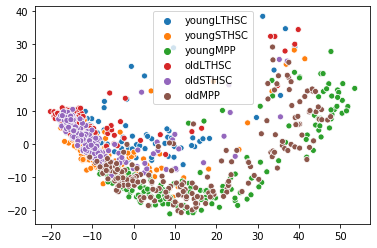

In [974]:
sns.scatterplot(pcakmfit[:,0], pcakmfit[:,1], hue = df2.index)

In [956]:
agg = AgglomerativeClustering(n_clusters = 12, affinity='cosine',linkage = 'complete')
aggdata = agg.fit(df2)
aggclusters = aggdata.labels_

In [957]:
df2agg = df2.copy()
df2agg.index = aggclusters
y = [x for x in df2agg.index]

k =100
kbestagg = SelectKBest(k=k, score_func=f_classif)
X_best_featagg = kbestagg.fit_transform(df2agg,y)

X_best_featagg = pd.DataFrame(X_best_featagg, columns=df2agg.columns[kbestagg.get_support()])

aggbest = X_best_featagg.columns
aggbest


Index(['Wtap', 'H2-K1', 'Sell', 'Haao', 'Kif20a', 'uc008ewj.2', 'Kif11',
       'Dntt', 'Pdcd4', 'C330006A16Rik', 'Lrrc8a', 'Cd34', 'Bub1b',
       'D2Ertd750e', 'Casc5', 'Nusap1', 'Atp8b4', 'Bub1', 'Ckap2l', 'Tpx2',
       'Tgm2', 'Serinc3', 'uc012cnk.1', 'Ect2', 'Acad9', 'Slc39a1', 'Cd53',
       'Cenpe', 'Zdhhc21', 'Pdzk1ip1', 'Kif2c', 'Mpl', 'Cdca8', 'Ftl2',
       'Gm12940', 'Ptp4a2', 'Ccdc21', 'Gnb1', 'SNORD93', 'Plac8', 'Lat2',
       'Flt3', 'Cbx3', 'Mmrn1', 'Cdca3', 'Rps15', 'BC035044', 'uc009elc.1',
       'Vmn1r58', 'Apoe', 'Gmfg', 'Klf13', 'Prc1', 'Nupr1', 'Sult1a1', 'Kif22',
       'Mki67', 'Arglu1', 'Hmgb2', 'Gpr56', 'Gpr97', 'Sdpr', 'Rpl13',
       'uc009nvu.1', 'uc009nvv.1', 'Kif23', 'Ccnb2', 'Ppm1h', 'mt-Rnr1',
       'uc012hdk.1', 'Ptges3', 'Cd63', 'Kif4', 'uc012hne.1', 'Tespa1',
       'uc007hxv.1', 'Ppia', 'Aurkb', 'Fam64a', 'Wfdc17', 'Mpo', 'Abca12',
       'Top2a', 'Eif1', 'Ptrf', 'Srsf2', 'Birc5', 'Acot2', 'Ptma', 'Ighv1-30',
       'Zfp187', 'Serpinb1a', 'H2afy'

In [958]:
df2aggbest = df2agg[aggbest]

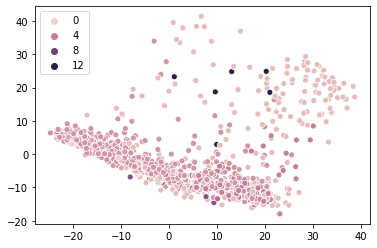

In [959]:
pcaagg = PCA(n_components = 2, random_state = 42)
pcaaggfit = pcaagg.fit_transform(df2aggbest)
sns.scatterplot(pcaaggfit[:,0], pcaaggfit[:,1], hue = aggclusters)#, palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})

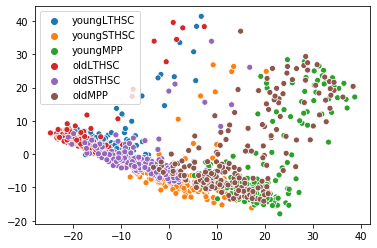

In [960]:
sns.scatterplot(pcaaggfit[:,0], pcaaggfit[:,1], hue = df2.index)

In [933]:
umap_results

array([[-0.30634853,  6.7485294 ],
       [ 1.251936  ,  6.4706097 ],
       [-0.6318347 ,  6.1221266 ],
       ...,
       [-3.8092427 ,  7.6608725 ],
       [-2.8663023 ,  7.6038976 ],
       [-3.5531373 ,  7.3212237 ]], dtype=float32)

In [282]:
dfcelltypes = pd.DataFrame(df2.mean(), columns = ['All cell average'])
dfcelltypes['youngLTHSC'] = df2[df2.index == 'youngLTHSC'].mean()
dfcelltypes['youngSTHSC'] = df2[df2.index == 'youngSTHSC'].mean()
dfcelltypes['youngMPP'] = df2[df2.index == 'youngMPP'].mean()
dfcelltypes['oldLTHSC'] = df2[df2.index == 'oldLTHSC'].mean()
dfcelltypes['oldSTHSC'] = df2[df2.index == 'oldSTHSC'].mean()
dfcelltypes['oldMPP'] = df2[df2.index == 'oldMPP'].mean()


In [283]:
dfcellbroad = pd.DataFrame(df2.mean(), columns = ['All cell average'])
dfcellbroad['HSC'] = df2[df2.index.str.contains('HSC')].mean()
dfcellbroad['MPP'] = df2[df2.index.str.contains('MPP')].mean()
dfcellbroad['HSC/MPP'] = dfcellbroad['HSC']/dfcellbroad['MPP']
dfcellbroad.sort_values(by = ['HSC/MPP','HSC','MPP'], ascending = False).head(25000)


,All cell average,HSC,MPP,HSC/MPP
Efna1,0.643563,0.969929,0.000000,inf
Epor,0.195888,0.295228,0.000000,inf
A230065H16Rik,0.188828,0.284587,0.000000,inf
Entpd2,0.118563,0.178689,0.000000,inf
uc012bnh.1,0.012618,0.019017,0.000000,inf
Chst2,0.390340,0.586040,0.004438,132.044430
Tenc1,0.414679,0.619929,0.009944,62.343120
Sytl5,0.261078,0.390157,0.006545,59.611924
Smtnl1,0.344102,0.513490,0.010084,50.919903
Fkbp10,0.207335,0.307536,0.009747,31.551204


(array([2425., 2567., 1515.,  823.,  515.,  282.,  154.,   83.,   48.,
           4.]),
 array([ 0.        ,  1.3572191 ,  2.7144382 ,  4.0716573 ,  5.4288764 ,
         6.78609551,  8.14331461,  9.50053371, 10.85775281, 12.21497191,
        13.57219101]),
 <a list of 10 Patch objects>)

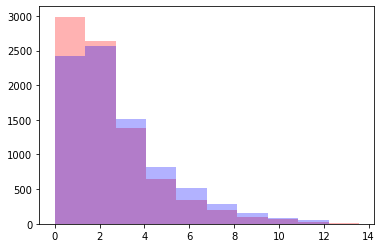

In [284]:
plt.hist(dfcellbroad.HSC, color = 'r', alpha = 0.3)
plt.hist(dfcellbroad.MPP, color = 'b', alpha = 0.3)

In [285]:
dfcbnonzeros = dfcellbroad[dfcellbroad != 0].dropna()
dfcbnonzeros.sort_values(by = ['HSC/MPP','HSC','MPP'], ascending = False).head(25000)

,All cell average,HSC,MPP,HSC/MPP
Chst2,0.390340,0.586040,0.004438,132.044430
Tenc1,0.414679,0.619929,0.009944,62.343120
Sytl5,0.261078,0.390157,0.006545,59.611924
Smtnl1,0.344102,0.513490,0.010084,50.919903
Fkbp10,0.207335,0.307536,0.009747,31.551204
Trim47,0.618185,0.916453,0.030028,30.519856
Sdpr,1.132590,1.675926,0.061180,27.393463
Prom2,0.127051,0.187080,0.008680,21.553527
Gstm2,0.393667,0.579074,0.028062,20.635673
Cldn5,0.133289,0.196054,0.009522,20.588575


In [781]:
y = [x for x in df2.index]

k = 200
kbest = SelectKBest(k=k, score_func=f_classif)
X_best_feat = kbest.fit_transform(df2,y)

X_best_feat = pd.DataFrame(X_best_feat, columns=df2.columns[kbest.get_support()])

trimcol = X_best_feat.columns
trimcol


Index(['Wtap', 'uc007ams.1', 'Rab44', 'Abcg1', 'Ubash3a', 'H2-K1', 'H2-Ob',
       'H2-D1', 'Tubb5', 'Sell',
       ...
       'Lgals1', 'Rmi2', 'Marf1', 'Eif4g1', 'Bex6', 'uc007yyn.2', 'Gsk3b',
       'Sod1', 'Cdk6', 'Satb1'],
      dtype='object', length=200)

In [287]:
df2trim = df2.drop(trimcol, axis = 1).copy()
df2sel = df2[trimcol]
print(df2trim.shape, df2.shape)

(1058, 8396) (1058, 8416)


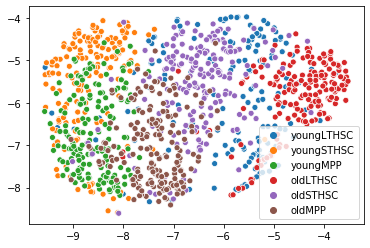

In [288]:
umap_resultstrim = umap.UMAP(n_neighbors=10,
                      min_dist=.1,
                      metric='correlation').fit_transform(df2trim)
sns.scatterplot(umap_resultstrim[:,0], umap_resultstrim[:,1], hue = df2.index)

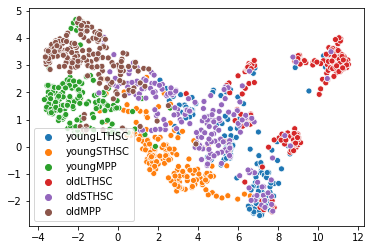

In [289]:
umap_resultssel = umap.UMAP(n_neighbors=50,
                      min_dist=.3,
                      metric='euclidean').fit_transform(df2sel)
sns.scatterplot(umap_resultssel[:,0], umap_resultssel[:,1], hue = df2.index)

In [290]:
pcatrim = PCA(n_components = 10)
pcafitdf2t = pcatrim.fit_transform(df2trim)

In [291]:
pcasel = PCA(n_components = 10)
pcafitdf2s = pcasel.fit_transform(df2sel)

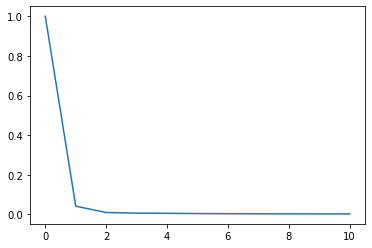

In [292]:
variancet = np.insert(pcatrim.explained_variance_ratio_, 0, 1)
x = [i for i in range(variancet.shape[0])]

plt.plot(x, variancet)

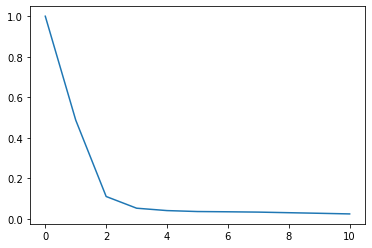

In [293]:
variances = np.insert(pcasel.explained_variance_ratio_, 0, 1)
x = [i for i in range(variances.shape[0])]

plt.plot(x, variances)

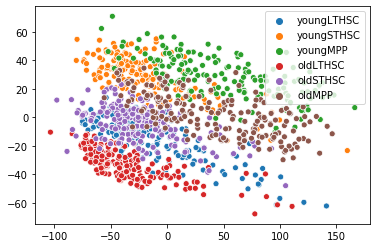

In [294]:
import seaborn as sns
sns.scatterplot(pcafitdf2t[:,0], pcafitdf2t[:,1], hue = df2.index)


variance threshold

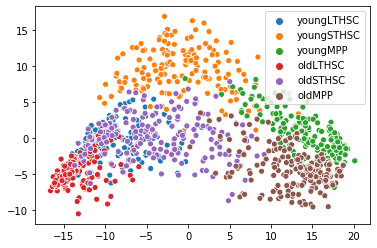

In [295]:
sns.scatterplot(pcafitdf2s[:,0], pcafitdf2s[:,1], hue = df2.index)

In [296]:
gmm = GaussianMixture(n_components = 6)
gmm.fit(df2sel)
cluster = gmm.fit_predict(df2sel)

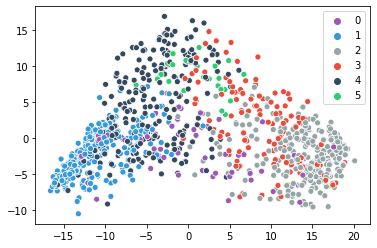

In [297]:
sns.scatterplot(pcafitdf2s[:,0], pcafitdf2s[:,1], hue = cluster,alpha = 1,palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"} )

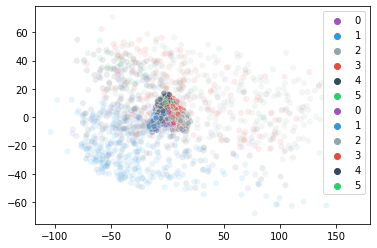

In [298]:
sns.scatterplot(pcafitdf2s[:,0], pcafitdf2s[:,1], alpha = .5,hue = cluster, palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})
sns.scatterplot(pcafitdf2t[:,0], pcafitdf2t[:,1], hue = cluster, alpha = .1,
palette = {0:"#9b59b6", 1:"#3498db", 2:"#95a5a6", 3:"#e74c3c", 4:"#34495e", 5:"#2ecc71"})

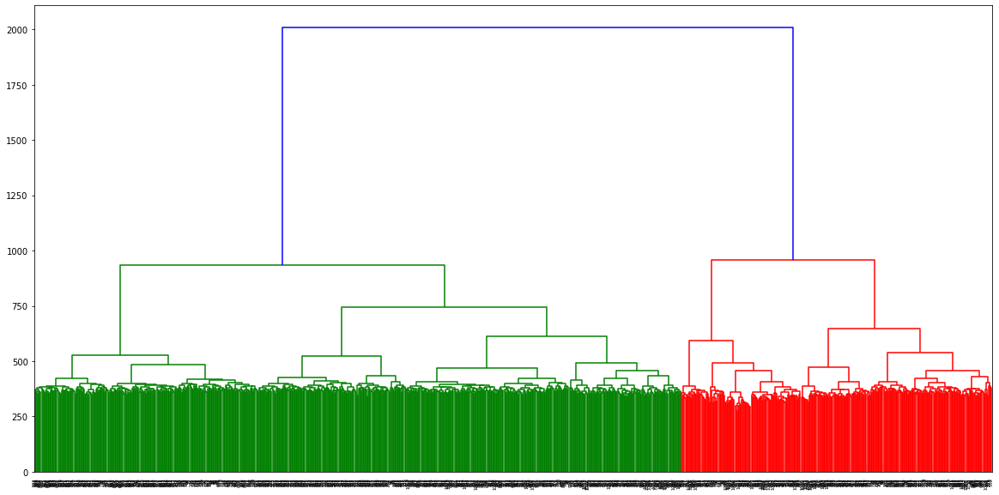

In [299]:
aggtrim = AgglomerativeClustering(n_clusters = 50, affinity='euclidean',linkage = 'complete')
aggtrimdata = aggtrim.fit(df2trim)
plt.figure(figsize=(20,10))
dendrogram(linkage(df2trim, method = 'ward'))
plt.show()

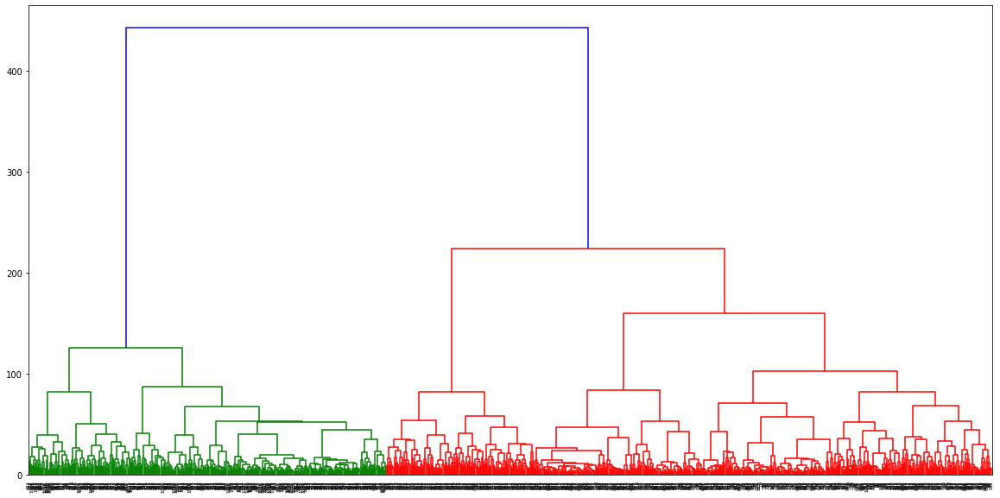

In [300]:
aggsel = AgglomerativeClustering(n_clusters = 50, affinity='euclidean',linkage = 'complete')
aggseldata = aggsel.fit(df2sel)
plt.figure(figsize=(20,10))
dendrogram(linkage(df2sel, method = 'ward'))
plt.show()

In [301]:
dfcellbroad['HSC'].corr(dfcellbroad['MPP'])

0.938469993476541

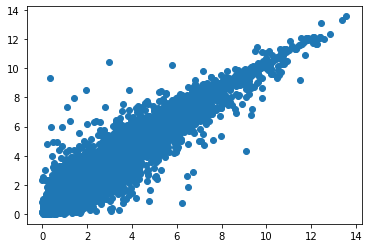

In [302]:
plt.scatter(dfcellbroad['HSC'], dfcellbroad['MPP'])